# A2-Q6: Pursuit Problem

In [2]:
import numpy as np

from scipy.integrate import solve_ivp
from scipy.interpolate import make_interp_spline

import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

%matplotlib inline

In [3]:
def target(t):
    #
    # The target path is a helix
    #

    x_T = np.sin(t)
    y_T = np.cos(t)
    z_T = t
    
    return (x_T, y_T, z_T)

In [5]:
def rocket(t,P,SP,DMIN):
    #
    # This is the function that is called by the ODE solver.
    # It implements the differential equations defining
    # the trajectory of the pursuer.
    #
    # t: time
    # P: position of the pursuer
    # SP: Speed of the pursuer
    #
    # DMIN is not used here
    #   
    
    (x_P, y_P, z_P) = P
    
    (x_T, y_T, z_T) = target(t)
    
    dist = np.sqrt((x_T - x_P)**2 + (y_T - y_P)**2 + (z_T - z_P)**2)
    
    dx_P_dt = (SP / dist) * (x_T - x_P)
    dy_P_dt = (SP / dist) * (y_T - y_P)
    dz_P_dt = (SP / dist) * (z_T - z_P)
    
    return (dx_P_dt, dy_P_dt, dz_P_dt)


In [18]:
def rocket_events(t,P,SP,DMIN):
    #
    # This is the event function.
    # When the rocket gets within DMIN of the target,
    # it records the time t at which this happens, and
    # terminates the ODE solver.
    #
    # t: time
    # P: position of pursuer
    # SP is not used here
    #
    
    (x_P, y_P, z_P) = P
    
    # Getting the target's position at time t
    (x_T, y_T, z_T) = target(t)
    
    # Computing the distance between the target and the pursuer
    dist = np.sqrt((x_T - x_P)**2 + (y_T - y_P)**2 + (z_T - z_P)**2)
    
    return dist - DMIN

In [19]:
def animate(n,t,P):
    #
    # Plot the trajectory of the pursuer and target
    #
    # n: n-th frame of the animation
    # t[n]: time of n-th frame
    # P[n]: coordinates of the pursuer at time t[n]
    #
    T = target(t[n])
    Tx = [T[0]]; Ty = [T[1]]; Tz = [T[2]]
    Px = [P[n][0]]; Py = [P[n][1]]; Pz = [P[n][2]]
    
    ax.plot(Px, Py, Pz, 'go')
    ax.plot(Tx, Ty, Tz, 'bx')

[(1.4,   message: The solver successfully reached the end of the integration interval.
  success: True
   status: 0
        t: [ 0.000e+00  1.139e-01 ...  1.498e+01  1.500e+01]
        y: [[ 0.000e+00  2.851e-03 ...  8.253e-01  8.180e-01]
            [ 0.000e+00  4.946e-02 ... -4.287e-01 -4.428e-01]
            [-3.000e+00 -2.848e+00 ...  1.460e+01  1.461e+01]]
      sol: None
 t_events: [array([], dtype=float64)]
 y_events: [array([], dtype=float64)]
     nfev: 463
     njev: 0
      nlu: 0,   message: The solver successfully reached the end of the integration interval.
  success: True
   status: 0
        t: [ 0.000e+00  1.000e+00 ...  1.491e+01  1.500e+01]
        y: [[ 0.000e+00  1.906e-01 ...  8.532e-01  8.179e-01]
            [ 0.000e+00  3.094e-01 ... -3.684e-01 -4.430e-01]
            [-3.000e+00 -1.655e+00 ...  1.452e+01  1.461e+01]]
      sol: None
 t_events: [array([], dtype=float64)]
 y_events: [array([], dtype=float64)]
     nfev: 223
     njev: 0
      nlu: 0)]
[(1.4,   m

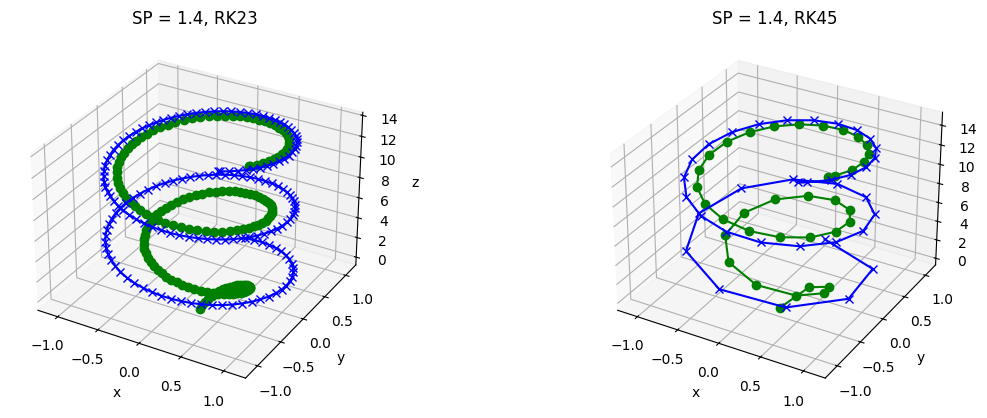

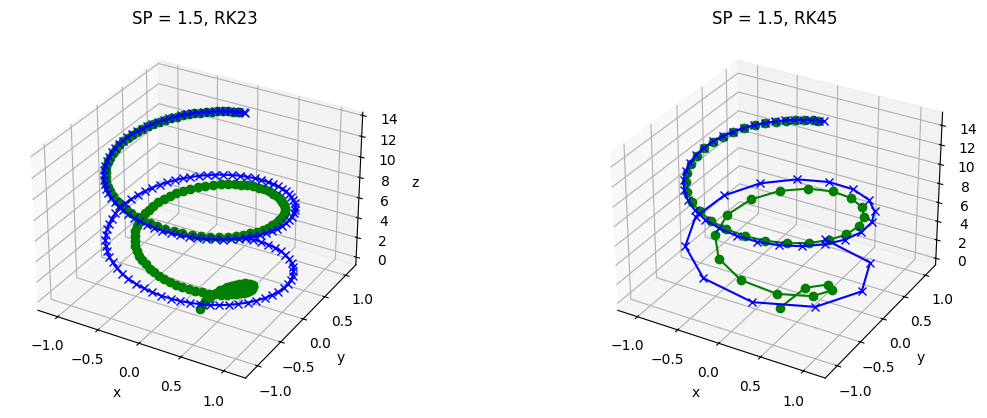

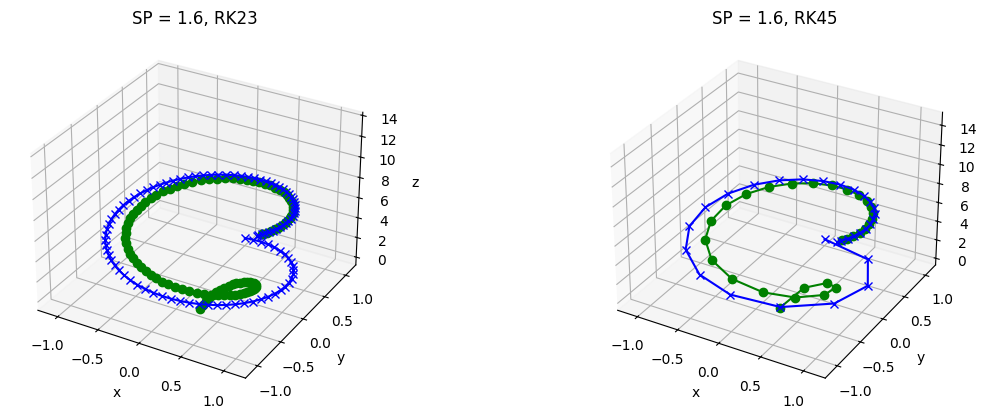

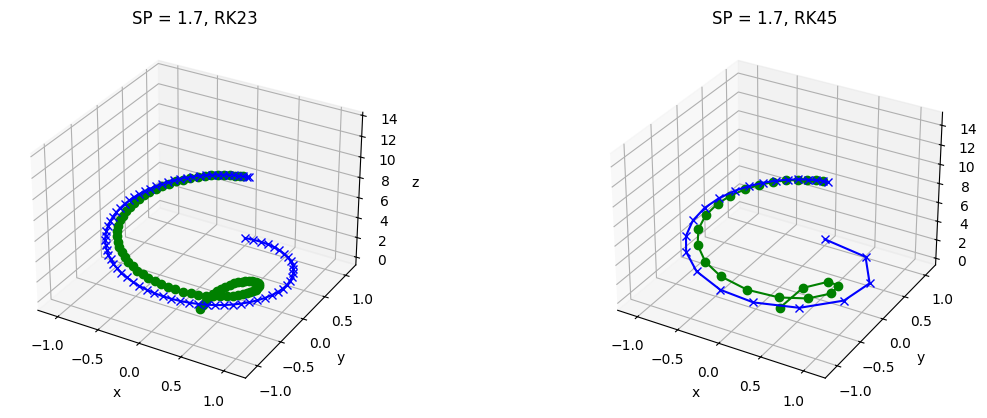

In [20]:
#
# Main program
#

results = []

#
# Set up parameter values for the pursuit problem
# t0, tfinal, etc
#

t_0 = 0
t_final = 15
P0 = [0, 0, -3]
DMIN = 0.1

#
# Set up parameter values for the ODE solver
# abs tol, rel tol, etc
#
atol = 1e-5
rtol = 1e-5
initial_step_size = 1
max_step_size = 1

#
# Solving ODEs
#
for SP in [1.4, 1.5, 1.6, 1.7]:
    #
    # Call ode solvers:
    # sol1 = solve_ivp( ... method = 'RK23' ... )
    # sol2 = solve_ivp( ... method = 'RK45' ... )
    #
    
    sol1 = solve_ivp(
        fun=rocket, 
        t_span=(t_0, t_final), 
        y0=P0, 
        args=(SP, DMIN), 
        method='RK23', 
        atol=atol, 
        rtol=rtol, 
        t_eval=None, 
        events=rocket_events, 
        first_step=initial_step_size, 
        max_step=max_step_size
    )

    sol2 = solve_ivp(
        fun=rocket, 
        t_span=(t_0, t_final), 
        y0=P0, 
        args=(SP, DMIN), 
        method='RK45', 
        atol=atol, 
        rtol=rtol,
        t_eval=None, 
        events=rocket_events, 
        first_step=initial_step_size, 
        max_step=max_step_size
    )

    results.append((SP, sol1, sol2))

    #
    # Display numerical results
    # number of time steps, number of evaluations, time of intercept
    #
    
    print(results)

    #
    # Display trajectories of 
    # Green: pursuer
    # Blue: target
    #
    fig = plt.figure(figsize=plt.figaspect(0.35))
    ax1 = fig.add_subplot(1,2,1, projection='3d')
    ax1.set_xlim3d(-1.2,1.2)
    ax1.set_ylim3d(-1.2,1.2)
    ax1.set_zlim3d(-0.5,14)
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    ax1.set_zlabel('z')
    ax1.set_title('SP = %.1f, RK23' %(SP))
    P1x, P1y, P1z = sol1.y
    ax1.plot3D(P1x, P1y, P1z, 'go-')
    Tx, Ty, Tz = target(sol1.t)
    ax1.plot3D(Tx, Ty, Tz, 'bx-')   
    
    ax2 = fig.add_subplot(1,2,2, projection='3d')
    ax2.set_xlim3d(-1.2,1.2)
    ax2.set_ylim3d(-1.2,1.2)
    ax2.set_zlim3d(-0.4,15)
    ax2.set_xlabel('x')
    ax2.set_ylabel('y')
    ax2.set_zlabel('z')
    ax2.set_title('SP = %.1f, RK45' %(SP))
    P2x, P2y, P2z = sol2.y
    ax2.plot3D(P2x, P2y, P2z, 'go-')
    Tx, Ty, Tz = target(sol2.t)
    ax2.plot3D(Tx, Ty, Tz, 'bx-')   

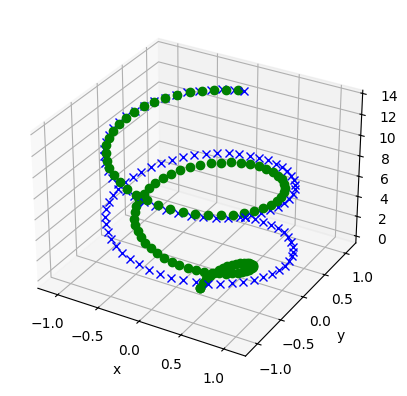

In [21]:
# (This one is just for fun)
#
# Animation of trajectories
# Green: pursuer
# Blue: target
#
fig = plt.figure()

ax = plt.axes(projection='3d')
ax.set_xlim3d(-1.2,1.2)
ax.set_ylim3d(-1.2,1.2)
ax.set_zlim3d(-0.4,14)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

#
# Solve the ODE for SP=1.5
#
SP = 1.5
sol = solve_ivp(
    fun=rocket, 
    t_span=(t_0, t_final), 
    y0=P0, 
    args=(SP, DMIN), 
    method='RK45', 
    atol=atol, 
    rtol=rtol,
    t_eval=None, 
    events=rocket_events, 
    first_step=initial_step_size, 
    max_step=max_step_size
)

t = sol.t
P = sol.y.T
n = np.size(t)

m = 100
cs = make_interp_spline(t,P)
tt = np.linspace(t[0],t[n-1],m)
PP = cs(tt)

# Create animation
anim = animation.FuncAnimation(fig, animate, frames = m, fargs = (tt, PP,), interval=100)
HTML(anim.to_jshtml())

In [22]:
formatted_results = []

for (SP, rk23_result, rk45_result) in results:
    formatted_results.append({
        "SP": SP,
        "RK23": {
            "time_steps": len(rk23_result.t),
            "num_evaluations": rk23_result.nfev,
            "time_of_intercept": rk23_result.t_events[0][0] if len(rk23_result.t_events[0]) > 0 else None
        },
        "RK45": {
            "time_steps": len(rk45_result.t),
            "num_evaluations": rk45_result.nfev,
            "time_of_intercept": rk45_result.t_events[0][0] if len(rk45_result.t_events[0]) > 0 else None
        }
    })

In [17]:
formatted_results

[{'SP': 1.4,
  'RK23': {'time_steps': 153,
   'num_evaluations': 463,
   'time_of_intercept': None},
  'RK45': {'time_steps': 36,
   'num_evaluations': 223,
   'time_of_intercept': None}},
 {'SP': 1.5,
  'RK23': {'time_steps': 4871,
   'num_evaluations': 14650,
   'time_of_intercept': 12.5478939141638},
  'RK45': {'time_steps': 2934,
   'num_evaluations': 17713,
   'time_of_intercept': 12.54012526275028}},
 {'SP': 1.6,
  'RK23': {'time_steps': 34772,
   'num_evaluations': 104350,
   'time_of_intercept': 8.280705438086999},
  'RK45': {'time_steps': 16901,
   'num_evaluations': 101569,
   'time_of_intercept': 8.278235585817683}},
 {'SP': 1.7,
  'RK23': {'time_steps': 59364,
   'num_evaluations': 178141,
   'time_of_intercept': 6.323006705708822},
  'RK45': {'time_steps': 26523,
   'num_evaluations': 167185,
   'time_of_intercept': 6.3218917196139195}}]